<h1 style="font-size: 15" <b> Manual curation of cell type assignment after label transfer </b> </h1>

Date: 2023-11-20 <br>
Author: ASF

# Set up

In [1]:
import sys
import os
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse

import scanpy as sc

In [2]:
sc.settings.set_figure_params(dpi=90, dpi_save=300)

# Read in anndata after label transfer

In [3]:
adata = sc.read("../datasets/adata_labelTransfer_celltypes_samplesFilt.h5ad")

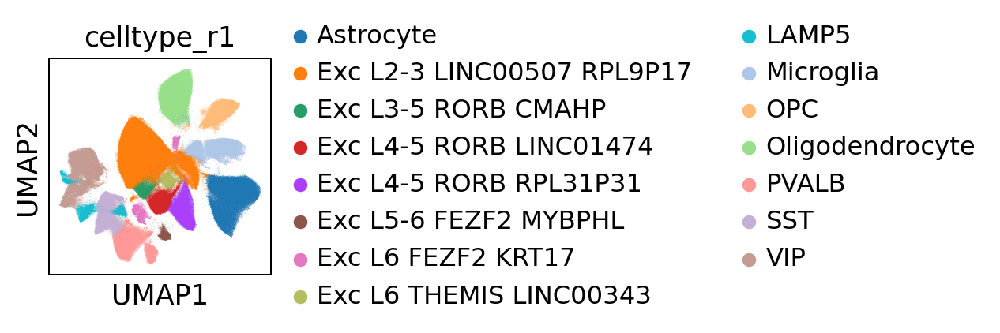

In [4]:
# plot UMAP with labels from label transfer
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.umap(adata, color='celltype_r1')

# Manual curation of cell-type labels

## Glial cell types

### Astrocytes

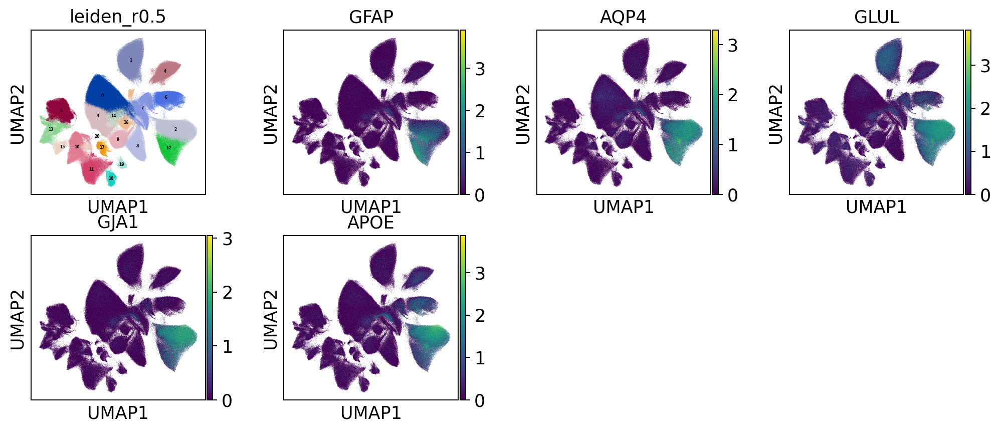

In [5]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'GFAP', 'AQP4', 'GLUL', 'GJA1', 'APOE'], legend_loc='on data', legend_fontsize
=3)

In [6]:
#make a subset only containing the two astrocyte clusters leiden_r0.5 cluster2 and cluster 12
adata_subset_astro = adata[adata.obs["leiden_r0.5"].isin(["2", "12"])]

In [7]:
#two subclusters within astrocyte cluster
# protoplasmic vs fibrous astrocytes
# also see  Velmeshev 2019 10.1126/science.aav8130 Supplementary Information
astro_markers = ['GFAP', 'AQP4', 'GLUL', 'GJA1', 'APOE']
FB = ['GFAP', 'DPP10', 'ARHGEF4', 'DCLK2']
PP = ['ATP1A2', 'SGCD', 'GJA1', 'HPSE2', 'CABLES1', 'TPD52L1']
#PP ['SLC1A2','SLC1A3', 'NKAIN3', 'COL5A3', 'RORA', 'CACNB2','GPC5','GLUL']

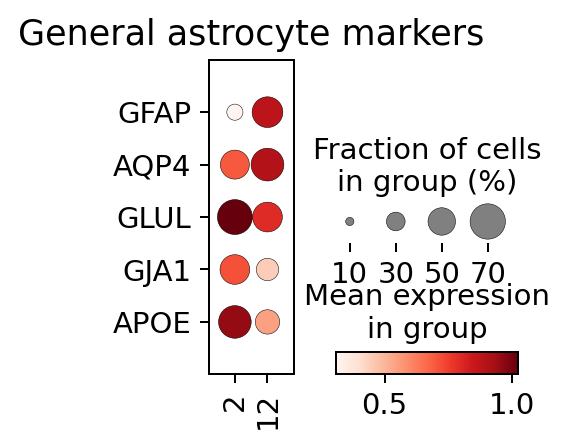

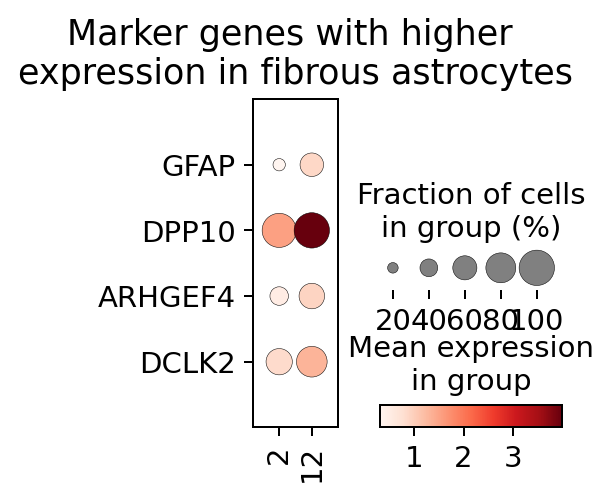

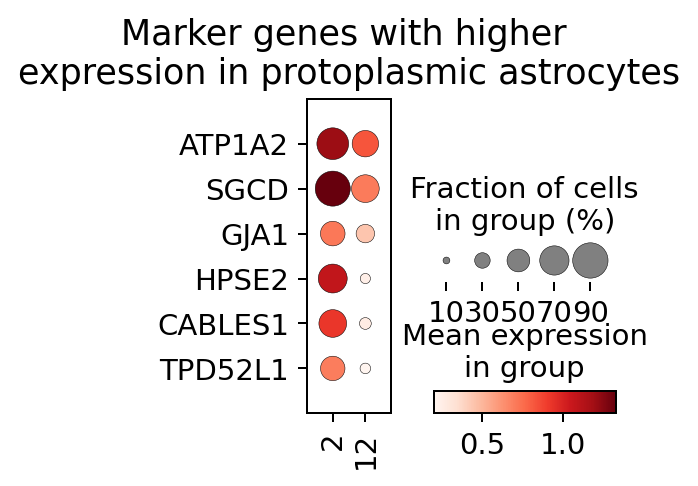

In [8]:
with plt.rc_context({"figure.figsize": (0.7, 0.7)}):
    sc.pl.dotplot(adata_subset_astro, astro_markers, groupby='leiden_r0.5', figsize=[2.2,2.3], swap_axes=True, title='General astrocyte markers')
    sc.pl.dotplot(adata_subset_astro, FB, groupby='leiden_r0.5', figsize=[2.2,2.4], swap_axes=True, title='Marker genes with higher \nexpression in fibrous astrocytes')
    sc.pl.dotplot(adata_subset_astro, PP, groupby='leiden_r0.5', figsize=[2.2,2.3], swap_axes=True, title='Marker genes with higher \nexpression in protoplasmic astrocytes')

<b> -> cluster 12 </b> of leiden_r0.5 represents <b> fibrous astrocytes (Astro_FB) </b> <br>
<b> -> cluster 2 </b> of leiden_r0.5 represents <b> protoplasmic astrocytes (Astro_PP) </b>

### Endothelial cells

<b> Endothelial cells were not assigned by label transfer <br> </b>
look for endothelial markers

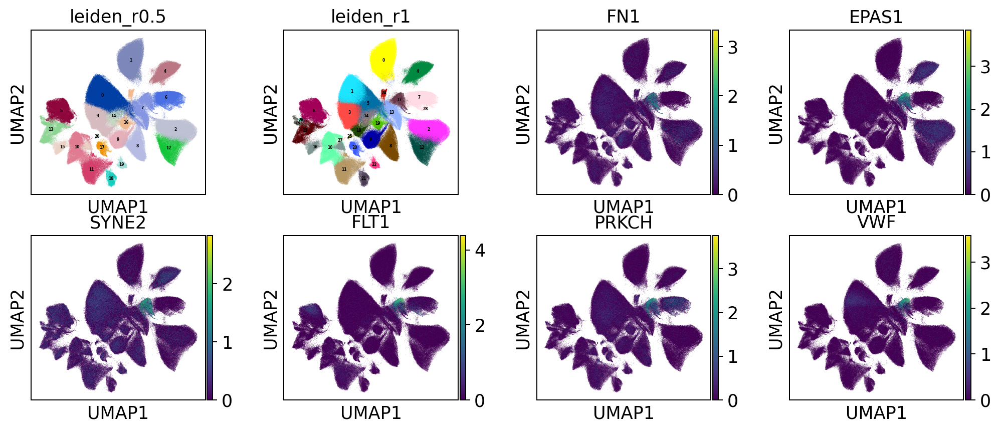

In [9]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'leiden_r1', 'FN1', 'EPAS1', 'SYNE2', 'FLT1', 'PRKCH', 'VWF'], legend_loc='on data', legend_fontsize
=3)

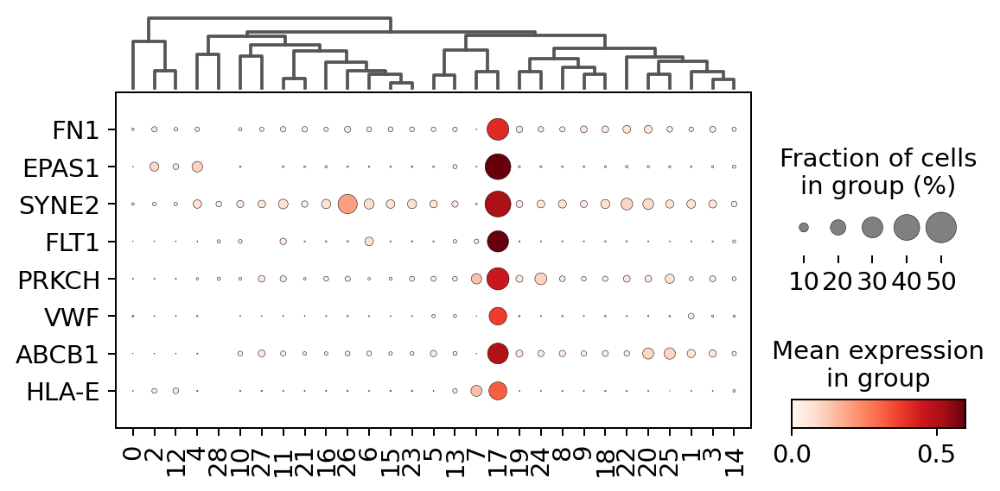

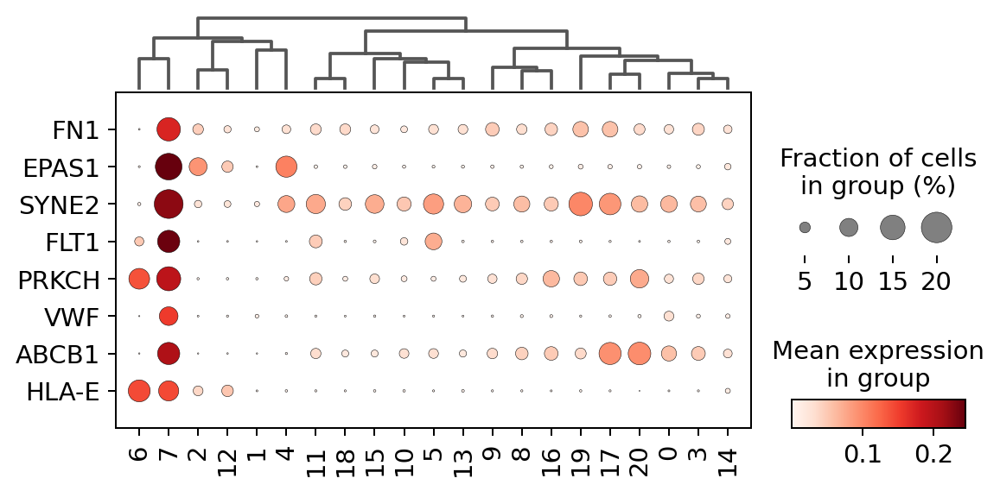

In [10]:
endo_markers = ['FN1', 'EPAS1', 'SYNE2', 'FLT1', 'PRKCH', 'VWF', 'ABCB1', 'HLA-E']
with plt.rc_context({"figure.figsize": (1.5, 1.5)}):
    sc.pl.dotplot(adata, endo_markers, groupby='leiden_r1', dendrogram=True, figsize=[7,3.5], swap_axes=True)
    sc.pl.dotplot(adata, endo_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[7,3.5], swap_axes=True)

<b> -> cluster 17 </b> of leiden_r1 represents <b> endothelial cells </b> <br>
<b> -> cluster 7 </b> of leiden_r0.5 contains <b> endothelial cells and other cells </b>

## Microglia

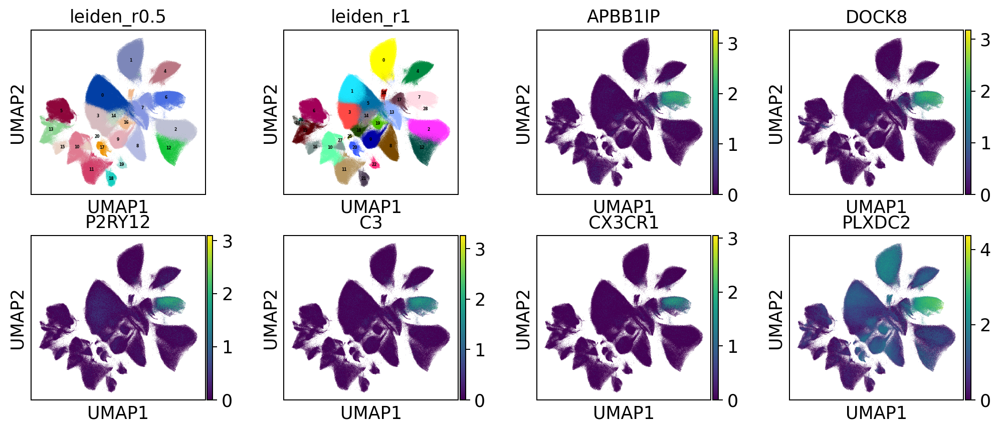

In [11]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'leiden_r1', 'APBB1IP', 'DOCK8', 'P2RY12', 'C3', 'CX3CR1', 'PLXDC2'],legend_loc='on data', legend_fontsize=3)

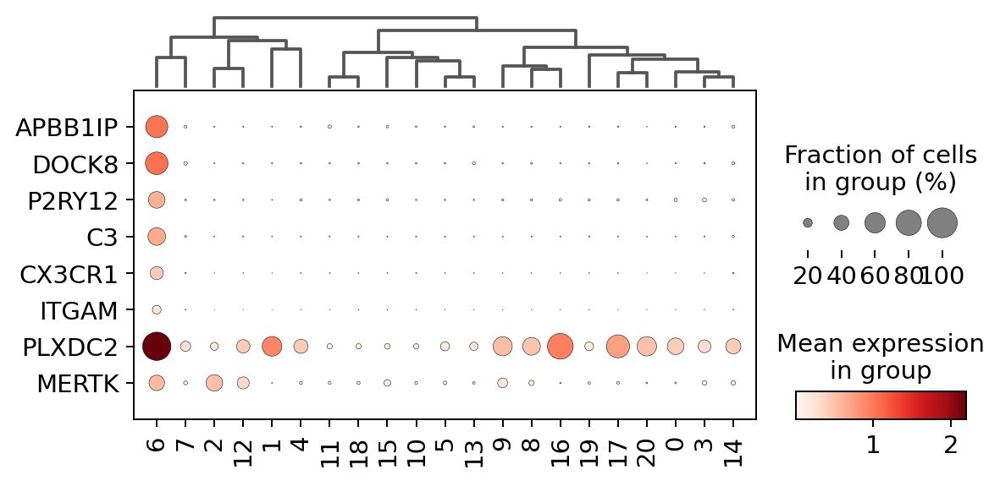

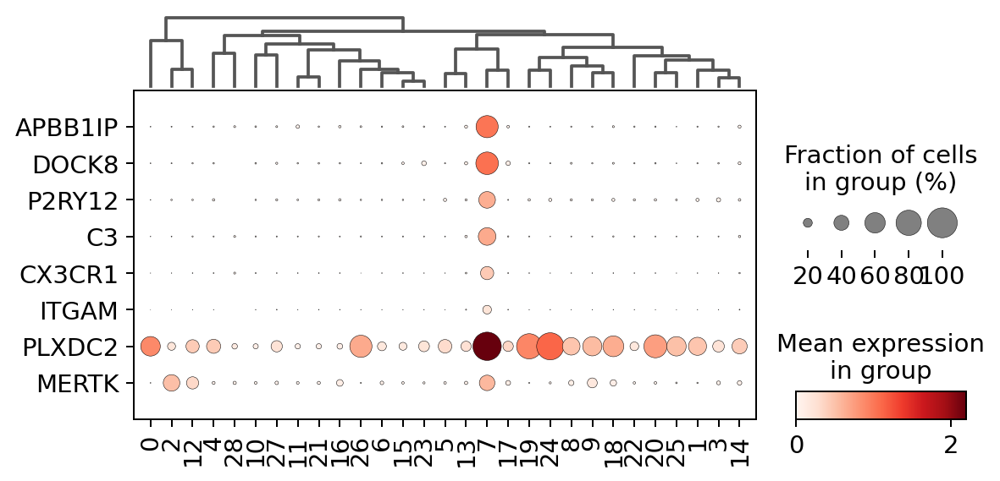

In [12]:
# Check microglia markers
microglia_markers = ['APBB1IP', 'DOCK8', 'P2RY12', 'C3', 'CX3CR1', 'ITGAM', 'PLXDC2','MERTK']
with plt.rc_context({"figure.figsize": (1.5, 1.5)}):
    sc.pl.dotplot(adata, microglia_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[7,3.5], swap_axes=True)
    sc.pl.dotplot(adata, microglia_markers, groupby='leiden_r1', dendrogram=True, figsize=[7,3.5], swap_axes=True)

<b> -> cluster 6 of leiden_r0.5 and cluster 7 </b> of leiden_r1 represents <b> microglia </b> <br>
<b> -> cluster 17 </b> of leiden_r1 represents <b> endothelial cells not microglia </b>

## Oligodendrocytes

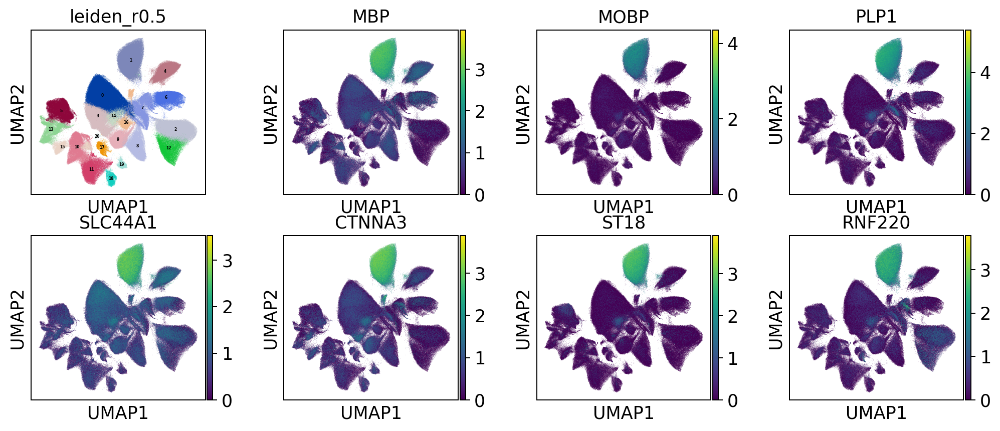

In [13]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'MBP', 'MOBP', 'PLP1', 'SLC44A1', 'CTNNA3', 'ST18', 'RNF220'], legend_loc='on data', legend_fontsize=3)

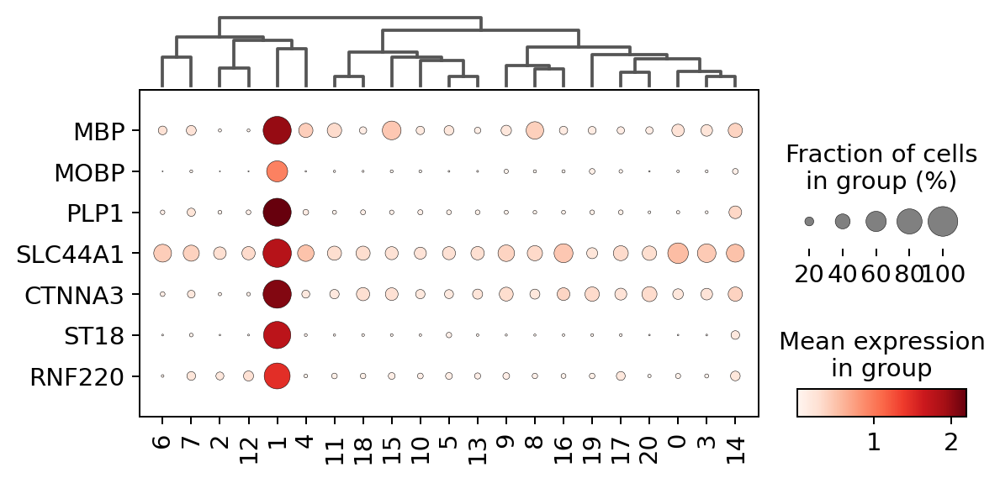

In [14]:
# Check oligodendrocyte markers
oligo_markers = ['MBP', 'MOBP', 'PLP1', 'SLC44A1', 'CTNNA3', 'ST18', 'RNF220']
with plt.rc_context({"figure.figsize": (1.5, 1.5)}):
    sc.pl.dotplot(adata, oligo_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[7,3.5], swap_axes=True)

<b> -> cluster 1 of leiden_r0.5 </b>  and cluster 0 of leiden_r1 represents <b> oligodendrocytes </b> <br>

## Oligodendrocyte precursors (OPC)

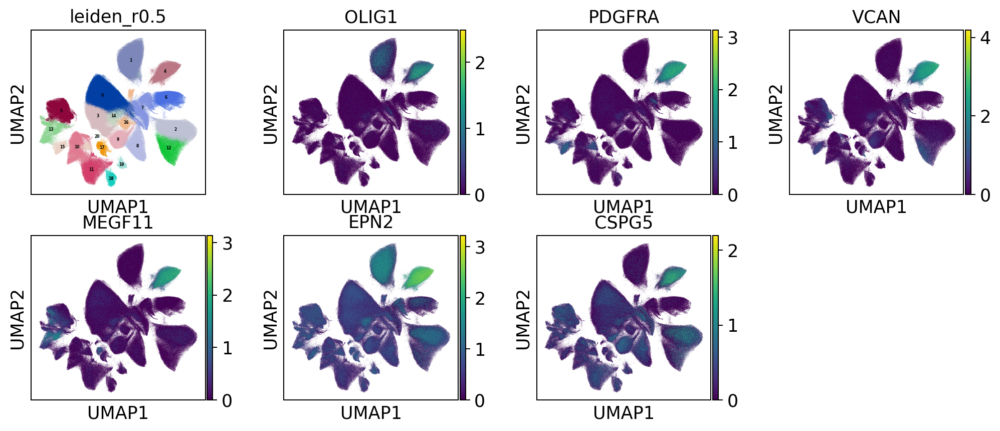

In [15]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'OLIG1', 'PDGFRA', 'VCAN', 'MEGF11', 'EPN2', 'CSPG5'], 
           legend_loc='on data', legend_fontsize=3)

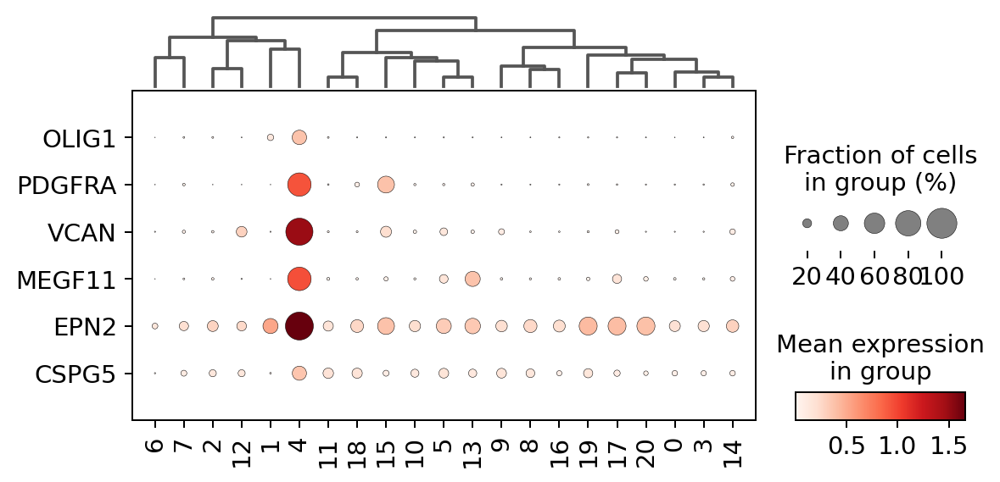

In [16]:
# Check oligodendrocyte precursor markers
opc_markers = ['OLIG1', 'PDGFRA', 'VCAN', 'MEGF11', 'EPN2', 'CSPG5']
#'NEU4', 'CSPG4'
with plt.rc_context({"figure.figsize": (1.5, 1.5)}):
    sc.pl.dotplot(adata, opc_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[7,3.5], swap_axes=True)

<b> -> cluster 4 of leiden_r0.5 </b>  and cluster 4 of leiden_r1 represents <b> OPC </b> <br>

# Neurons

## General neuronal markers

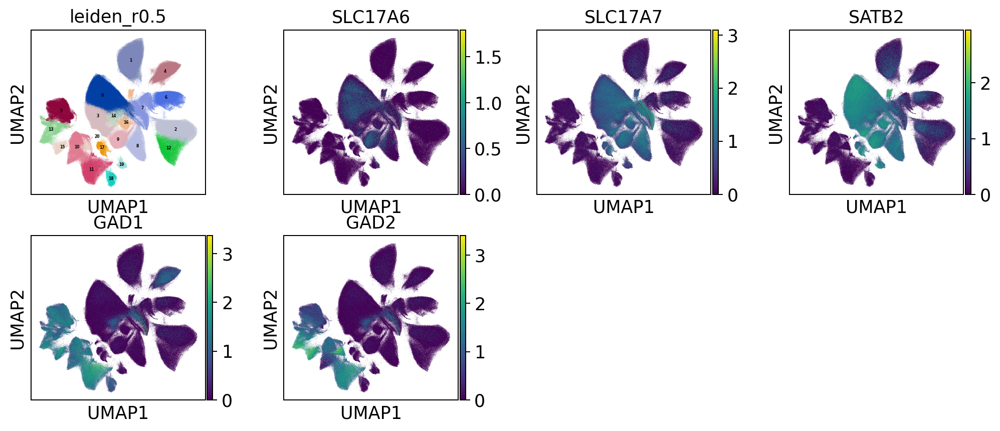

In [17]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata, color=['leiden_r0.5', 'SLC17A6', "SLC17A7", "SATB2", 'GAD1', 'GAD2'], 
           legend_loc='on data', legend_fontsize=3)

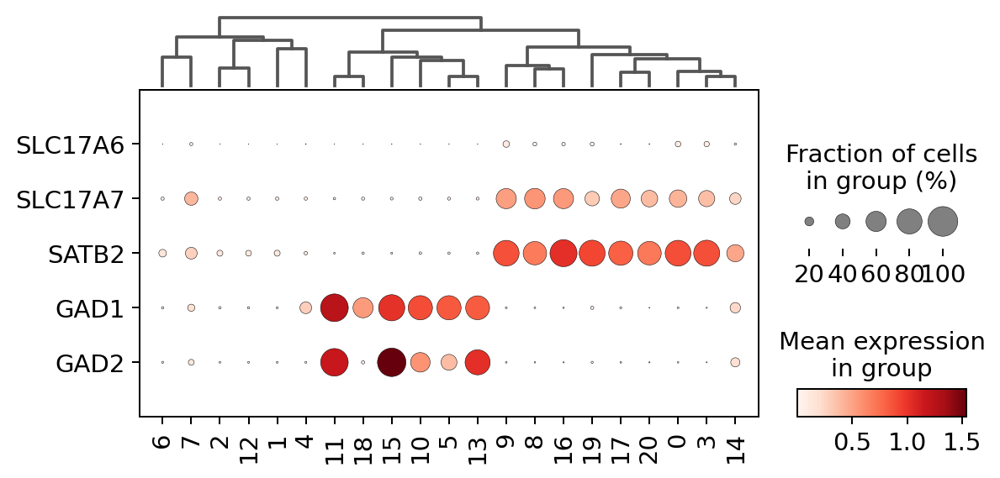

In [18]:
# General excitatory and inhibitory neuronal markers
neuronal_markers = ['SLC17A6', "SLC17A7", "SATB2", 'GAD1', 'GAD2']

#exc ["SLC17A7", "SATB2"]
#in ['GAD1', 'GAD2']

with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata, neuronal_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[7,3.5], swap_axes=True)

## Excitatory Neurons

In [19]:
adata_exc = (adata[adata.obs['leiden_r0.5'].isin(['0', '3', '7', '8', '9', '14', '16', '17', '19', '20'])])

### upper layer

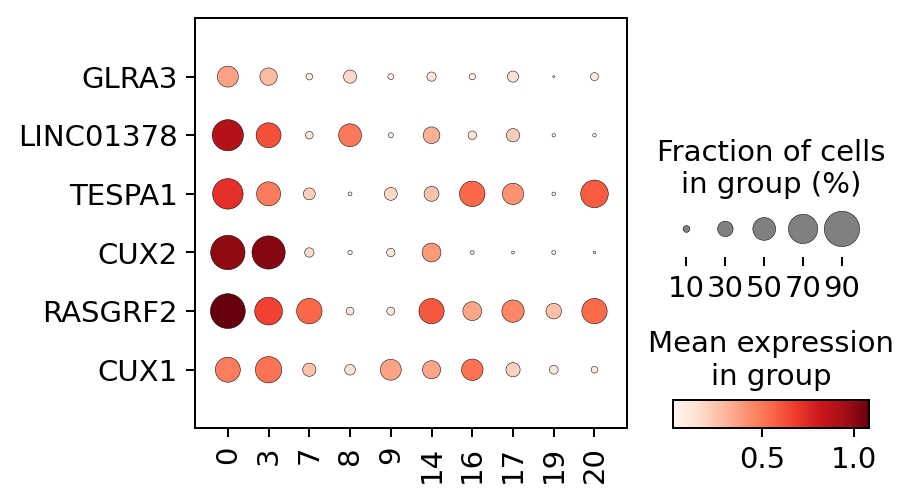

In [20]:
#layer-specific markers L2-3
#sc.tl.dendrogram(adata_exc, groupby='leiden_r0.5')

L2_3 = ['GLRA3', 'LINC01378', 'TESPA1', 'CUX2', 'RASGRF2', 'CUX1']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L2_3, groupby='leiden_r0.5', dendrogram=False, figsize=[4.8,3], swap_axes=True)

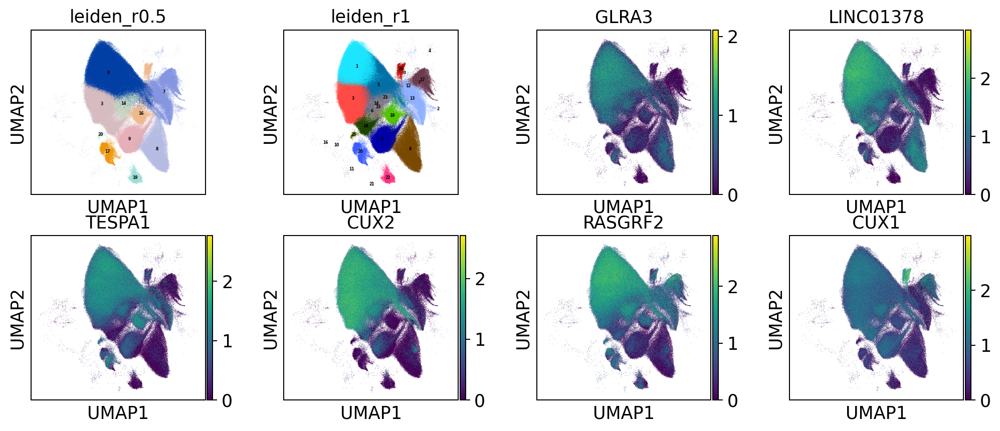

In [21]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata_exc, color=['leiden_r0.5', 'leiden_r1', 'GLRA3', 'LINC01378', 'TESPA1', 
                                 'CUX2', 'RASGRF2', 'CUX1'], legend_loc='on data', legend_fontsize=3)

<b> cluster 0, 14 and part of 3 </b> represent <b> Exc_L2-3 </b> <br>
cluster 1, 3, 5, 14 of leiden_r1 represent Exc_L2-3

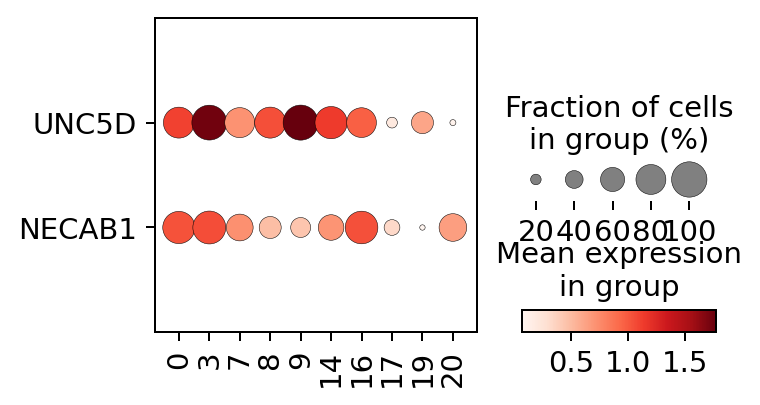

In [22]:
# L2-4
L2_4 = ['UNC5D', 'NECAB1']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L2_4, groupby='leiden_r0.5', dendrogram=False, figsize=[4,2.3], swap_axes=True)

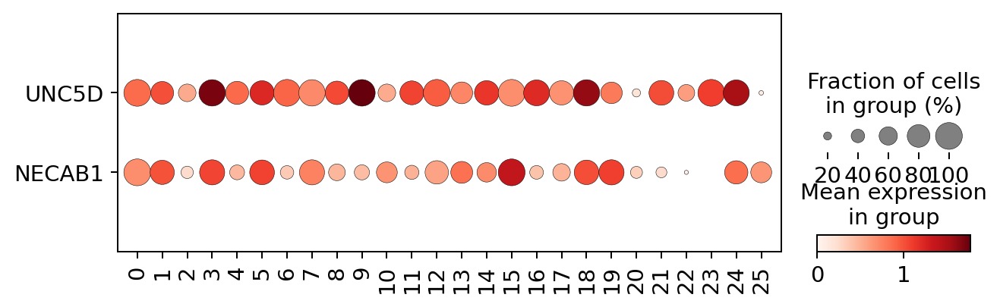

In [23]:
# L2-4
L2_4 = ['UNC5D', 'NECAB1']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L2_4, groupby='leiden_r1', dendrogram=False, figsize=[8,2.3], swap_axes=True)

### deeper layer

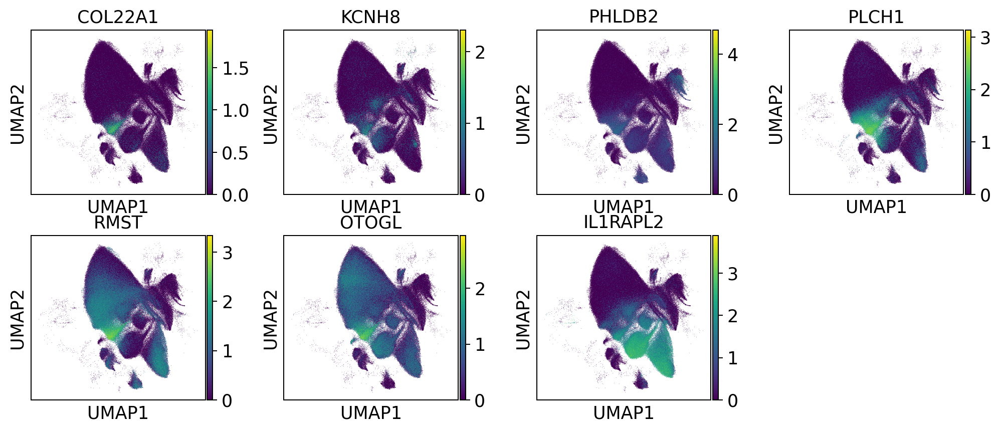

In [24]:
#L3-5:
# Exc L3-5 RORB CMAHP
# https://toppcell.cchmc.org/biosystems/go/index3/shred/Kang/data%20for%20toppcell/brainAtlas/HumanMultipleCorticalArea_Allen/Output%20by%20Sample%20group%20by%20Lineage%20by%20Lineage%20subclass%20by%20Cell%20class%20by%20Cell%20subclass%20by%20Cell%20type-3 

with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata_exc, color=['COL22A1', 'KCNH8', 'PHLDB2', 'PLCH1', 'RMST', 'OTOGL', 'IL1RAPL2'], legend_loc='on data', legend_fontsize=3)

<b> cluster 3 of leiden_r0.5 </b> contains <b> Exc_L3-5 </b> cluster <br>
cluster 18 of leiden_r1 is Exc_L3-5

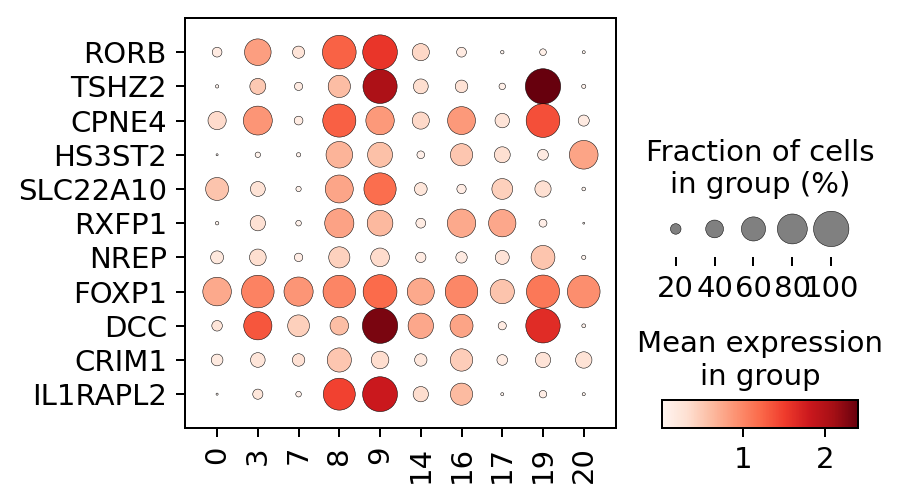

In [25]:
# layer-specific markers L4
L4 = ['RORB', 'TSHZ2', 'CPNE4', 'HS3ST2', 'SLC22A10', 'RXFP1', 'NREP', 'FOXP1', 'DCC', 'CRIM1', 'IL1RAPL2']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L4, groupby='leiden_r0.5', dendrogram=False, figsize=[4.8,3], swap_axes=True)

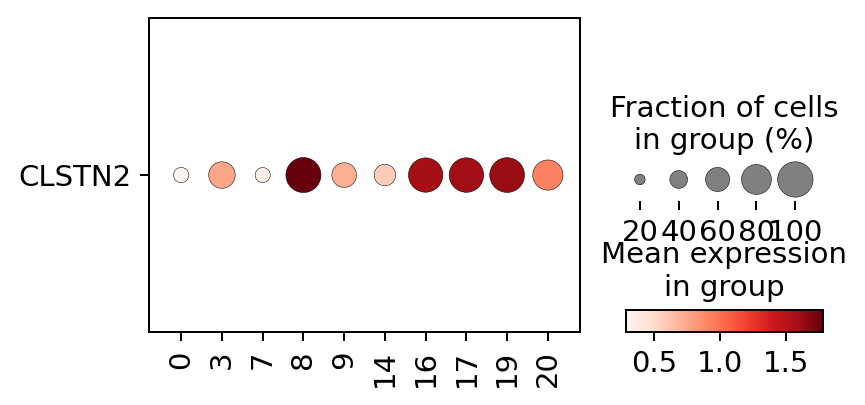

In [26]:
# layer-specific markers L4-6
L4_6 = ['CLSTN2']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L4_6, groupby='leiden_r0.5', dendrogram=False, figsize=[4.8,2.3], swap_axes=True)

<b> cluster 8, 9 and 16 of leiden_r0.5 represent 3 clusters of Exc_L4-6 </b>

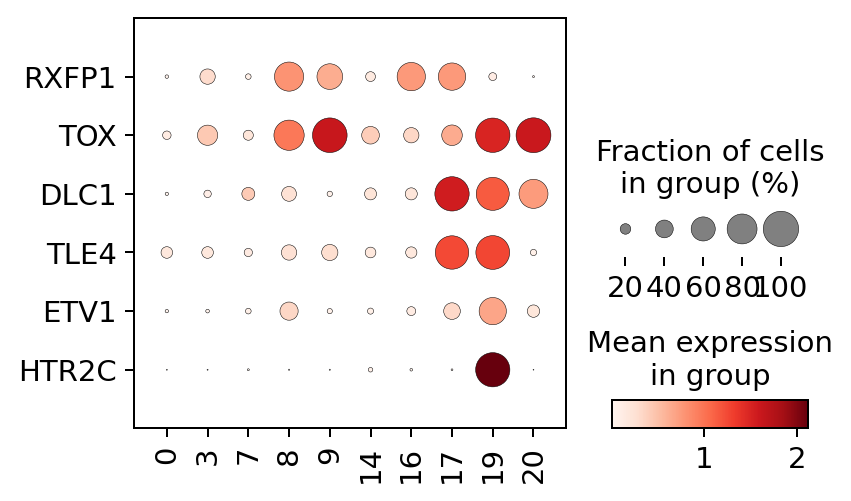

In [27]:
# layer-specific markers L5-6
L5_6 = ['RXFP1', 'TOX', 'DLC1', 'TLE4', 'ETV1', 'HTR2C']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, L5_6, groupby='leiden_r0.5', dendrogram=False, figsize=[4.8,3], swap_axes=True)

<b> -> cluster 17 of leiden_r0.5 represents Exc_L5-6_1 <br>
-> cluster 20 of leiden_r0.5 represents Exc_L5-6_2 <br> 
-> cluster 19 of leiden_r0.5 represents Exc_L5-6_HTR2C </b>

## Inhibitory Neurons

### Cardinal classes

In [28]:
adata_inhib = (adata[adata.obs['leiden_r0.5'].isin(['5', '10', '11', '13', '15', '18'])])

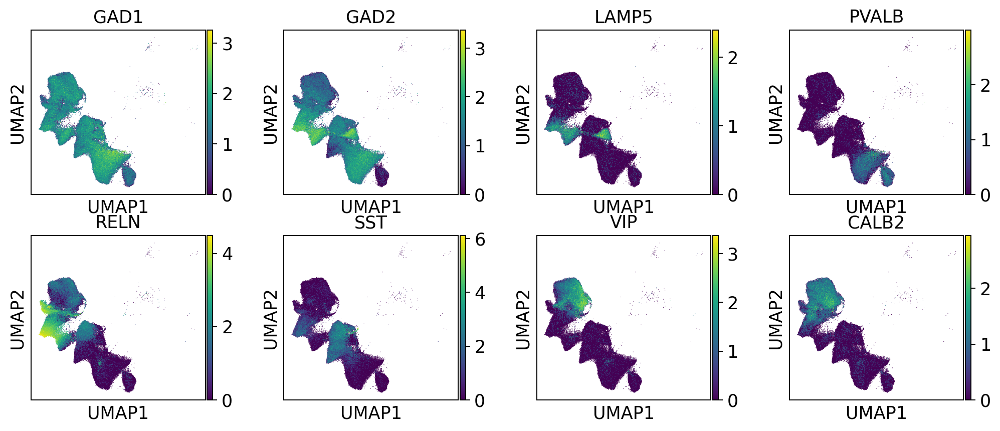

In [29]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
                    sc.pl.umap(adata_inhib, color=['GAD1', 'GAD2', 'LAMP5', 'PVALB', 'RELN', 'SST', 'VIP', 'CALB2'])

/u/afroe/conda-envs/sc-env-mar2022/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/u/afroe/conda-envs/sc-env-mar2022/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


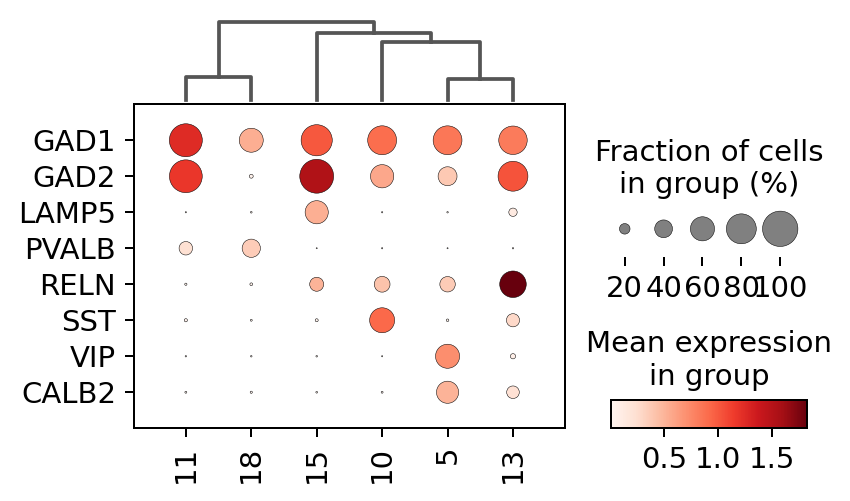

In [30]:
# Check inhibitory neuron subtype markers
sc.tl.dendrogram(adata_inhib, groupby='leiden_r0.5'),
inh_markers = ['GAD1', 'GAD2', 'LAMP5', 'PVALB', 'RELN', 'SST', 'VIP', 'CALB2']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_inhib, inh_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[4.8,3], swap_axes=True)

<b> -> cluster 5 of leiden_r0.5 represents In_VIP <br>
-> cluster 11 and cluster 18 of leiden_r0.5 represent 2 In_PVALB clusters <br>
-> cluster 15 of leiden_r0.5 represents In_LAMP5 <br>
-> cluster 13 of leiden_r0.5 represents In_RELN <br>
-> cluster 10 of leiden_r0.5 represents In_SST </b>

### Inhibitory PVALB subtypes

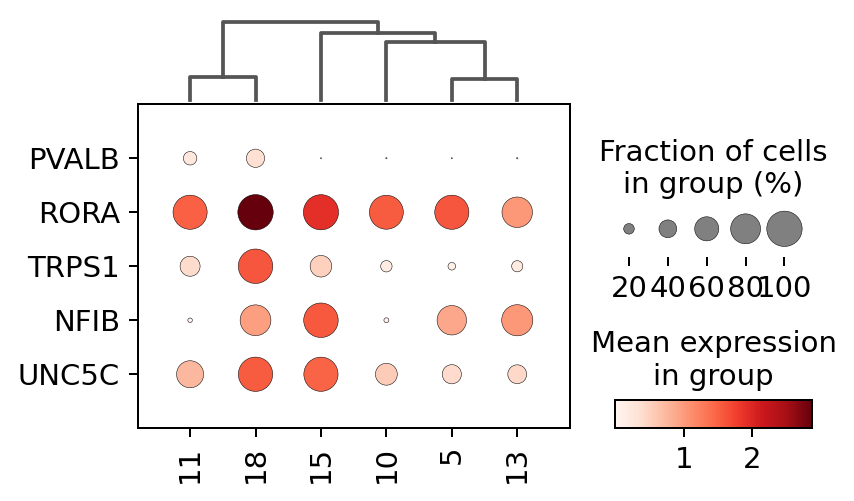

In [31]:
# Chandelier markers from Bakken et al. 2021 https://doi.org/10.1038/s41586-021-03465-8
Ch_markers = ["PVALB", "RORA", "TRPS1", "NFIB", "UNC5C"]
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_inhib, Ch_markers, groupby='leiden_r0.5', dendrogram=True, figsize=[4.8,3], swap_axes=True)

<b> -> cluster 11 of leiden_r0.5 represents In_PVALB_Ba (Basket cells) <br>
-> cluster 18 of leiden_r0.5 represents In_PVALB_Ch (Chandelier cells) </b>

### Inhibitory LAMP5 subtypes

/u/afroe/conda-envs/sc-env-mar2022/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


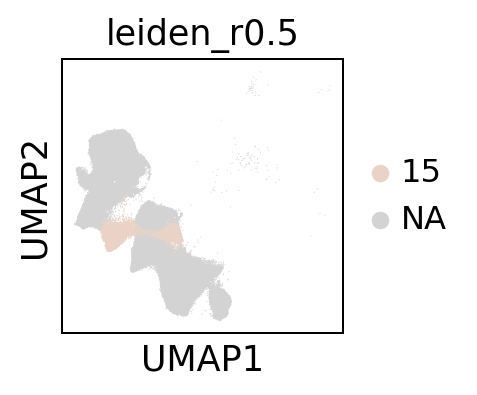

In [32]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.umap(adata_inhib, color=['leiden_r0.5'],groups='15')
#looks like two distinct clusters within cluster 15 (In_LAMP5)

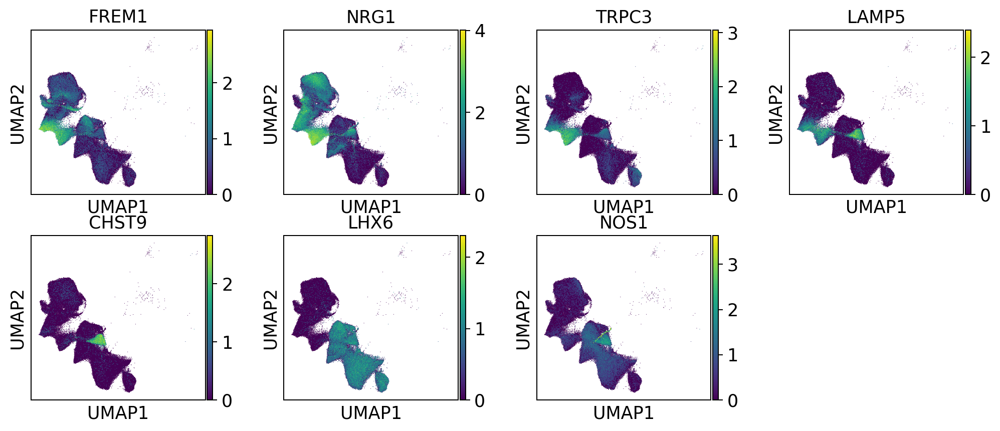

In [33]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
                    sc.pl.umap(adata_inhib, color=['FREM1', 'NRG1', 'TRPC3', 'LAMP5', 'CHST9', 'LHX6', 'NOS1'])

Krienen et al. 2020  10.1038/s41586-020-2781-z <br>
describe In LAMP5 LHX6+ subtype <br>
<b> cluster 15: <br>
              left cluster: higher expression of FREM1, NRG1, and TRPC3 <br>
              right cluster: higher expression of CHST9, LHX6, NOS1 </b>

# Final Cell Type Assignment

## subclustering

### Endothelial cells

In [34]:
#subclustering of cluster 7 to obtain the "hidden" endothelial cells
sc.tl.leiden(adata, resolution=0.05, key_added="leiden_r0.5_sub7", restrict_to=('leiden_r0.5', ['7']))

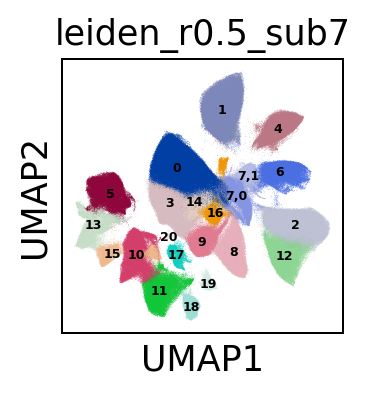

In [35]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.umap(adata, color="leiden_r0.5_sub7", legend_loc='on data', legend_fontsize=5)

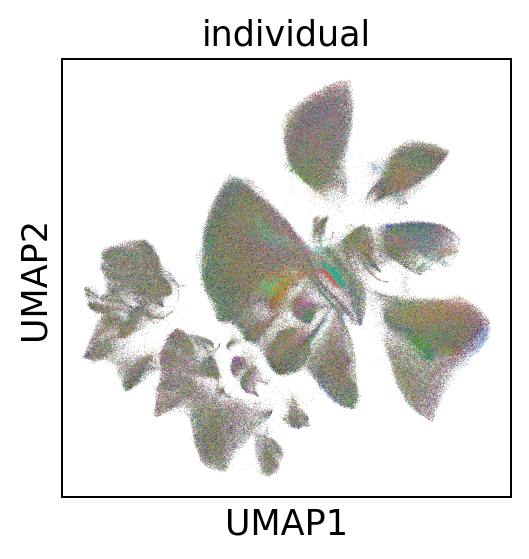

In [37]:
with plt.rc_context({"figure.figsize": (3.2, 3.2)}):
    sc.pl.umap(adata, color='individual', legend_loc=None)
    # cluster 7,0 seems to have a lot of nuclei from a few individuals only

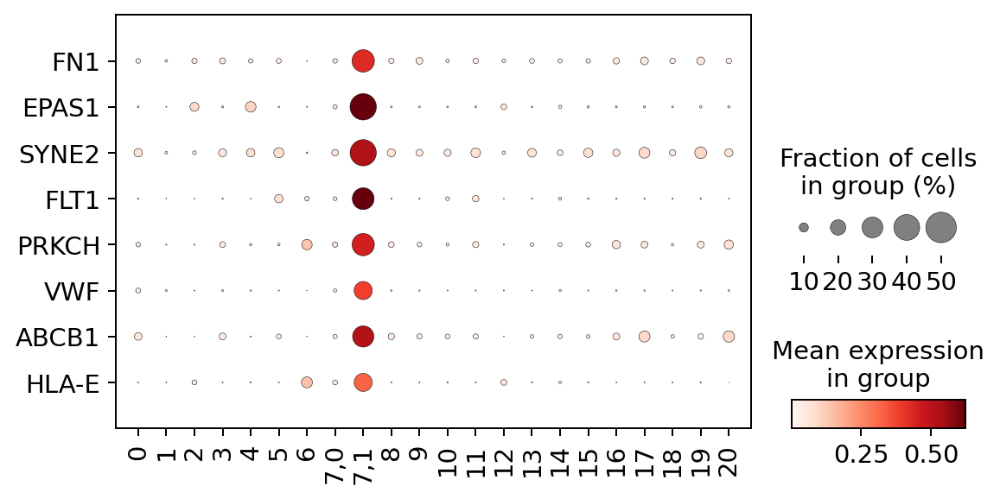

In [38]:
# Endothelial cells - cluster 7,1
endo_markers = ['FN1', 'EPAS1', 'SYNE2', 'FLT1', 'PRKCH', 'VWF', 'ABCB1', 'HLA-E']
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata, endo_markers, groupby='leiden_r0.5_sub7', dendrogram=False, figsize=[7,3.5], swap_axes=True)

In [39]:
# remove cluster 7,0 -> 3 individuals contribute more than 25% of nuclei
adata_filtered = adata[~adata.obs['leiden_r0.5_sub7'].isin(['7,0'])].copy()

### Exc_L3-5

In [40]:
#subclustering of cluster 3 (leiden_r0.5) to obtain cluster 18 represented in leiden_r1
# low levels of CUX2, RASGRF2, TESPA1
#Exc_L3-5
sc.tl.leiden(adata_filtered, resolution=0.05, key_added="leiden_r0.5_sub3", restrict_to=('leiden_r0.5_sub7', ['3']))

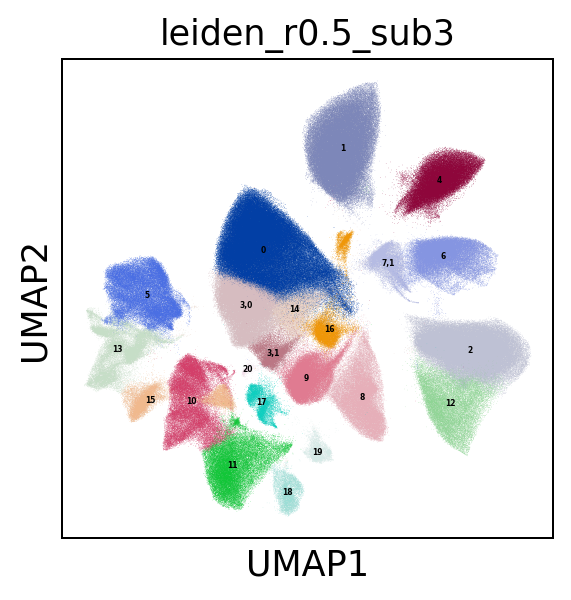

In [41]:
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata_filtered, color="leiden_r0.5_sub3", legend_loc='on data', legend_fontsize=3 )

<b> cluster 3,1 represents Exc_L3-5 </b>

### Inhibitory LAMP5 subtypes

In [42]:
sc.tl.leiden(adata_filtered, resolution=0.1, restrict_to=['leiden_r0.5_sub3', ['15']], key_added='leiden_r0.5_sub15')

/u/afroe/conda-envs/sc-env-mar2022/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


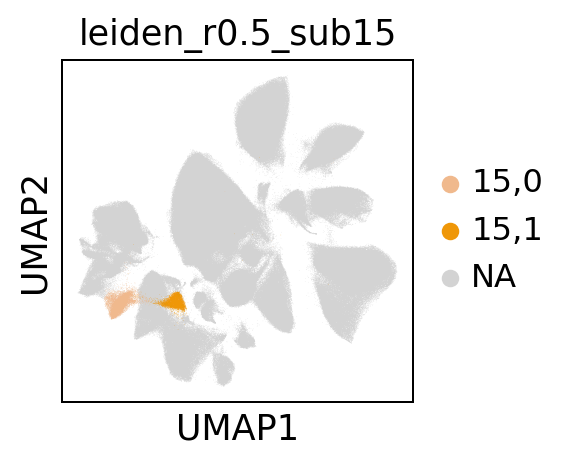

In [43]:
with plt.rc_context({"figure.figsize": (2.5, 2.5)}):
    sc.pl.umap(adata_filtered, color=['leiden_r0.5_sub15'], groups=['15,0', '15,1'])

In [44]:
LAMP5_subclusters = (adata_filtered[adata_filtered.obs['leiden_r0.5_sub15'].isin(['15,0','15,1'])])

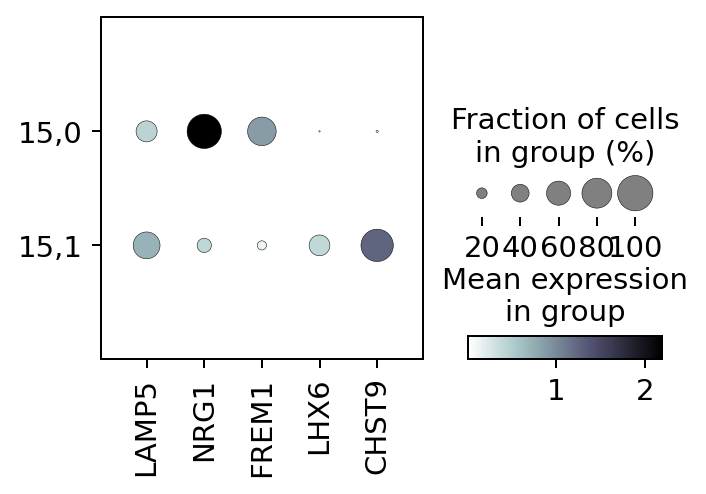

In [45]:
LAMP5_markers = ['LAMP5', 'NRG1', 'FREM1', 'LHX6', 'CHST9']
#NOS1
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(LAMP5_subclusters, LAMP5_markers , 'leiden_r0.5_sub15', dendrogram=False, 
              cmap='bone_r', figsize=(4,2.5))
#save='LAMP5_subtype_markeres.pdf')

## combining of clusters

In [47]:
adata_filtered.obs['leiden_r0.5_comb'] = adata_filtered.obs['leiden_r0.5_sub15'].copy()

In [48]:
#combine Exc_L2-3
adata_filtered.obs['leiden_r0.5_comb'][adata_filtered.obs['leiden_r0.5_comb']=='3,0'] = '0' #combine cluster 0 and 3,0
adata_filtered.obs['leiden_r0.5_comb'][adata_filtered.obs['leiden_r0.5_comb']=='14'] = '0' #combine cluster 0 and 14

In [49]:
adata_filtered.obs['leiden_r0.5_comb'] = adata_filtered.obs['leiden_r0.5_comb'].cat.remove_unused_categories(inplace=False)

<ipython-input-49-7a7b945fc5aa>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  adata_filtered.obs['leiden_r0.5_comb'] = adata_filtered.obs['leiden_r0.5_comb'].cat.remove_unused_categories(inplace=False)


In [50]:
#see all cluster names
adata_filtered.obs['leiden_r0.5_comb'].dtype

CategoricalDtype(categories=['0', '1', '2', '3,1', '4', '5', '6', '7,1', '8', '9', '10',
                  '11', '12', '13', '15,0', '15,1', '16', '17', '18', '19',
                  '20'],
, ordered=False)

## Naming of clusters

In [51]:
# List of annoted cell types in order of cluster number
cluster_names =['Exc_L2-3','Oligodendrocyte', 'Astro_PP', 'Exc_L3-5', 'OPC', 'In_VIP', 'Microglia', 
                'Endothelial', 'Exc_L4-6_1', 'Exc_L4-6_2', 'In_SST', 'In_PVALB_Ba', 'Astro_FB', 'In_RELN', 
                'In_LAMP5_1','In_LAMP5_2', 'Exc_L4-6_3', 'Exc_L5-6_1', 'In_PVALB_Ch', 'Exc_L5-6_HTR2C', 'Exc_L5-6_2']

In [52]:
adata_filtered.obs['celltypes_final']= adata_filtered.obs['leiden_r0.5_comb'].cat.rename_categories(cluster_names)

In [53]:
#see all cluster names
adata_filtered.obs['celltypes_final'].dtype

CategoricalDtype(categories=['Exc_L2-3', 'Oligodendrocyte', 'Astro_PP', 'Exc_L3-5', 'OPC',
                  'In_VIP', 'Microglia', 'Endothelial', 'Exc_L4-6_1',
                  'Exc_L4-6_2', 'In_SST', 'In_PVALB_Ba', 'Astro_FB', 'In_RELN',
                  'In_LAMP5_1', 'In_LAMP5_2', 'Exc_L4-6_3', 'Exc_L5-6_1',
                  'In_PVALB_Ch', 'Exc_L5-6_HTR2C', 'Exc_L5-6_2'],
, ordered=False)

In [54]:
#reorder clusters
adata_filtered.obs['celltypes_final'].cat.reorder_categories(['Exc_L2-3', 'Exc_L3-5', 'Exc_L4-6_1', 'Exc_L4-6_2', 
                                                              'Exc_L4-6_3', 'Exc_L5-6_1', 'Exc_L5-6_2', 'Exc_L5-6_HTR2C',
                                                              'In_LAMP5_1','In_LAMP5_2', 'In_PVALB_Ba', 'In_PVALB_Ch', 
                                                              'In_RELN', 'In_SST', 'In_VIP',  'Astro_FB', 'Astro_PP', 
                                                              'Endothelial', 'Microglia', 'Oligodendrocyte','OPC'],
                                                             inplace=True)

<ipython-input-54-195d1037bd52>:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata_filtered.obs['celltypes_final'].cat.reorder_categories(['Exc_L2-3', 'Exc_L3-5', 'Exc_L4-6_1', 'Exc_L4-6_2',


## Major Cell Types

In [57]:
#make a new column for Major cell types
adata_filtered.obs['major_celltypes'] = adata_filtered.obs['celltypes_final']

In [58]:
# summarise the cell types into Exc, Inh and Astro
# first: rename to one existing category
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L3-5']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L4-6_1']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L4-6_2']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L4-6_3']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L5-6_1']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L5-6_HTR2C']='Exc_L2-3'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Exc_L5-6_2']='Exc_L2-3'

adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_PVALB_Ba']='In_LAMP5_1'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_PVALB_Ch']='In_LAMP5_1'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_SST']='In_LAMP5_1'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_VIP']='In_LAMP5_1'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_RELN']='In_LAMP5_1'
adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='In_LAMP5_2']='In_LAMP5_1'

adata_filtered.obs['major_celltypes'][adata_filtered.obs['major_celltypes']=='Astro_FB']='Astro_PP'

In [59]:
adata_filtered.obs['major_celltypes'] = adata_filtered.obs['major_celltypes'].cat.remove_unused_categories(inplace=False)

<ipython-input-59-d44d827dee92>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  adata_filtered.obs['major_celltypes'] = adata_filtered.obs['major_celltypes'].cat.remove_unused_categories(inplace=False)


In [60]:
adata_filtered.obs['major_celltypes'].dtype

CategoricalDtype(categories=['Exc_L2-3', 'In_LAMP5_1', 'Astro_PP', 'Endothelial',
                  'Microglia', 'Oligodendrocyte', 'OPC'],
, ordered=False)

In [61]:
# List of annoted cell types in order of cluster number
cluster_names_MJ =['Exc_Neurons','In_Neurons', 'Astrocytes', 'Endothelial', 'Microglia', 'Oligodendrocyte', 'OPC']

In [62]:
adata_filtered.obs['major_celltypes']= adata_filtered.obs['major_celltypes'].cat.rename_categories(cluster_names_MJ)

In [63]:
#see all cluster names
adata_filtered.obs['major_celltypes'].dtype

CategoricalDtype(categories=['Exc_Neurons', 'In_Neurons', 'Astrocytes', 'Endothelial',
                  'Microglia', 'Oligodendrocyte', 'OPC'],
, ordered=False)

# save anndata object

## save total object

In [65]:
adata_filtered.write("../datasets/adata_celltypes_after_manual_curation_20231120.h5ad")

## extract controls and cases separately

In [66]:
adata_controls = adata_filtered[adata_filtered.obs['Status'].isin([0])].copy()
adata_controls.shape

(287818, 26195)

In [67]:
adata_controls.write("../datasets/adata_celltypes_after_manual_curation_Controls_20231120.h5ad")

In [68]:
adata_cases = adata_filtered[adata_filtered.obs['Status'].isin([1])].copy()
adata_cases.shape

(499867, 26195)

In [69]:
adata_cases.write("../datasets/adata_celltypes_after_manual_curation_Cases_20231120.h5ad")

# Nuclei Counts per cell type cluster

In [70]:
adata_filtered.obs['major_celltypes'].value_counts()

Exc_Neurons        329012
In_Neurons         153826
Astrocytes         113334
Oligodendrocyte     93357
OPC                 45435
Microglia           39154
Endothelial         13567
Name: major_celltypes, dtype: int64

In [71]:
adata_filtered.obs['celltypes_final'].value_counts()

Exc_L2-3           218679
Oligodendrocyte     93357
Astro_PP            87924
OPC                 45435
In_VIP              42250
Microglia           39154
Exc_L4-6_1          36486
Exc_L4-6_2          34813
In_SST              33791
In_PVALB_Ba         31796
Astro_FB            25410
In_RELN             24191
Exc_L4-6_3          14470
Endothelial         13567
Exc_L3-5            11815
In_LAMP5_1           9794
Exc_L5-6_1           7541
In_PVALB_Ch          6709
In_LAMP5_2           5295
Exc_L5-6_HTR2C       4139
Exc_L5-6_2           1069
Name: celltypes_final, dtype: int64

# extract counts and meta data for pseudobulk calculation

In [3]:
adata_filtered = sc.read("../datasets/adata_celltypes_after_manual_curation_20231120.h5ad")

In [72]:
# write adata.obs to file
adata_filtered.obs.to_csv("../datasets/adata.obs_20231120.tsv", sep="\t")

In [73]:
# write adata.var to file
adata_filtered.var.to_csv("../datasets/adata.var_20231120.tsv", sep="\t")

In [5]:
adata_filtered.layers
#raw counts are in adata.layers['counts']

Layers with keys: counts, sct_corrected

In [6]:
# create a new object X that contains raw expression values
# .A makes the sparse matrix stored in layer['counts'] dense
X = adata_filtered.layers['counts'].A

In [7]:
np.savetxt("../datasets/adata.rawcounts_20231120.tsv", X, fmt='%i', delimiter="\t")
# fmt='%i' to format as integers

# Figures for paper

In [2]:
sc.settings.set_figure_params(dpi=150, dpi_save=300)

In [3]:
adata = sc.read("../datasets/adata_celltypes_after_manual_curation_20231120.h5ad")

## Main Figures

### Fig1a,b,d

In [4]:
celltype_colors = {
    'Oligodendrocyte': "#FFE1A8",
    "OPC": "#FFC482",
    "Microglia": "#7A6C5D",
    "Endothelial": "#6e4c3c",
    "Astro_PP": "#DDC9B4",
    "Astro_FB" : "#BCAC9B",
    "In_VIP":"#472D30",
    "In_LAMP5_1":"#C17C74",
    "In_LAMP5_2":"#dab2ad",
    'In_RELN': "#781F19",
    "In_SST":"#723D46",
    "In_PVALB_Ba":"#E26D5C",
    "In_PVALB_Ch":"#EA8C55",
    "Exc_L2-3":"#2B3A67",
    "Exc_L5-6_2":"#748b97",
    "Exc_L5-6_1":"#66999B",
    "Exc_L5-6_HTR2C":"#727D71",
    "Exc_L3-5":"#588157",
    "Exc_L4-6_3":"#496A81",
    "Exc_L4-6_1":"#A3B18A",
    "Exc_L4-6_2":"#2A3D45"}

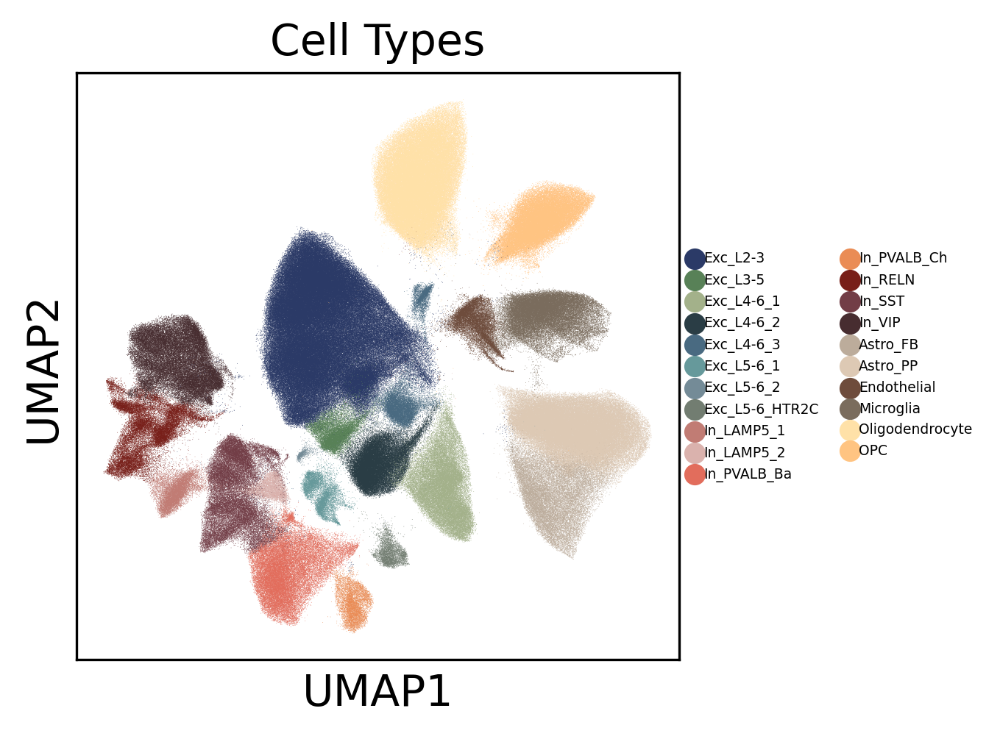

In [5]:
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color="celltypes_final", legend_fontsize=4.5, title='Cell Types', palette=celltype_colors) 
               #, save='_celltypes_final_no_legend.pdf' )

In [6]:
colors_major_celltypes={
    'Oligodendrocyte': "#FFE1A8",
    "OPC": "#FFC482",
    "Microglia": "#7A6C5D",
    "Endothelial": "#6e4c3c",
    "Exc_Neurons":"#2B3A67",
    "In_Neurons": "#e26d5c",
    "Astrocytes":"#ddc9b4"
}

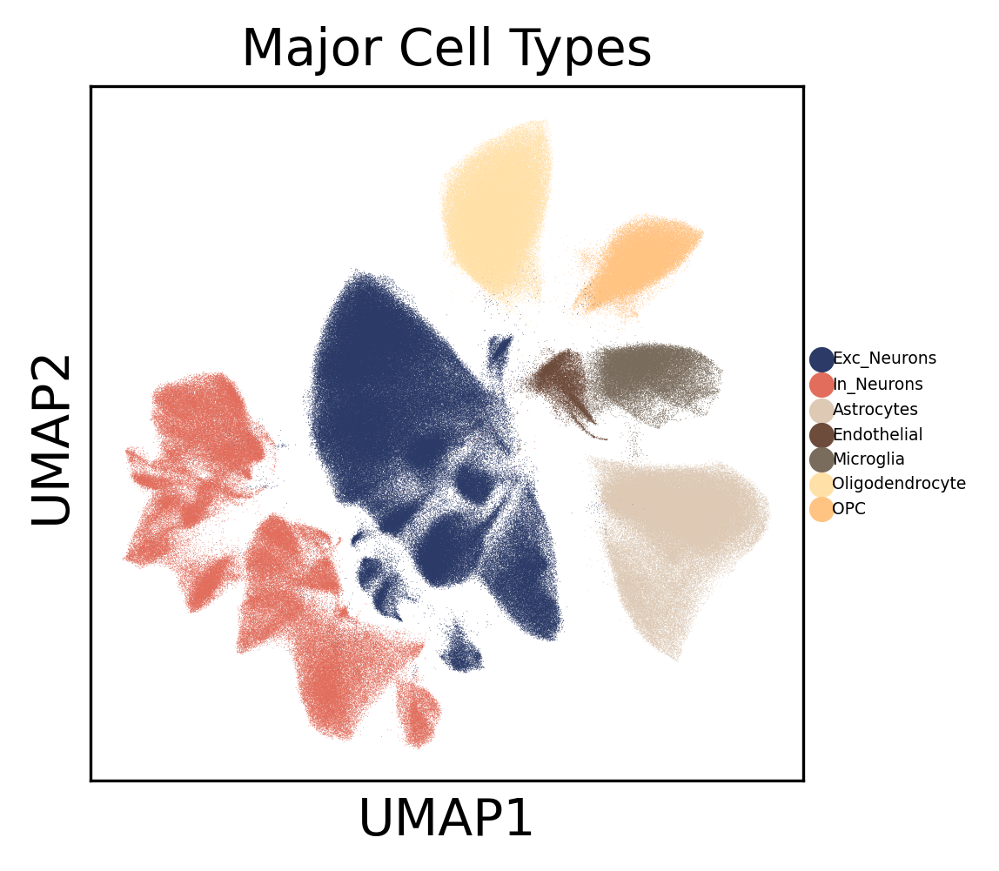

In [7]:
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color="major_celltypes", legend_fontsize=4.5, title='Major Cell Types', palette=colors_major_celltypes)
    #, save='_major_celltypes_no_legend.pdf' )

In [8]:
sc.tl.dendrogram(adata, groupby='celltypes_final', optimal_ordering=False, inplace=True)

In [9]:
marker_genes_dict = {'Astro': ['AQP4', 'GFAP','GJA1'],
                     'Endothelial': ['CLDN5', 'FLT1', 'SYNE2'],
                     'Microglia': ['APBB1IP','C3', 'P2RY12'],
                     'Oligo': ['MBP', 'MOBP','PLP1'],
                     'OPC': ['OLIG1', 'PDGFRA', 'VCAN'],
                     'In': ['GAD1', 'GAD2', 'NXPH1'],
                     'Exc': ['SATB2', 'SLC17A6', 'SLC17A7']
                    }

categories: Exc_L2-3, Exc_L3-5, Exc_L4-6_1, etc.
var_group_labels: Astro, Endothelial, Microglia, etc.


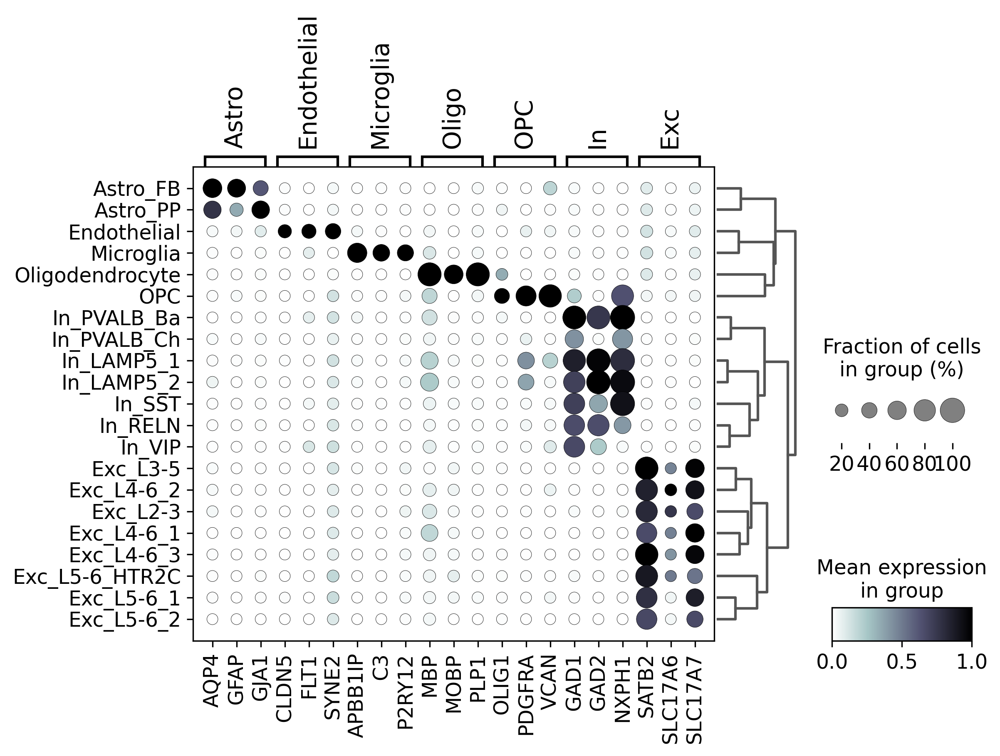

In [10]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    ax = sc.pl.dotplot(adata, marker_genes_dict, groupby='celltypes_final', dendrogram=True,
                   standard_scale='var', smallest_dot=40, color_map='bone_r', figsize=(8,5))
#, save='dotblot_celltype_markers_bone_r.pdf')
#color_map='bone_r, 'BuGn', 'Greys', 'copper_r', 'crest'

## Extended Data Figures

### Extended Data Fig 2a

In [ ]:
# Library prep batch
# Disease Status
# Sex

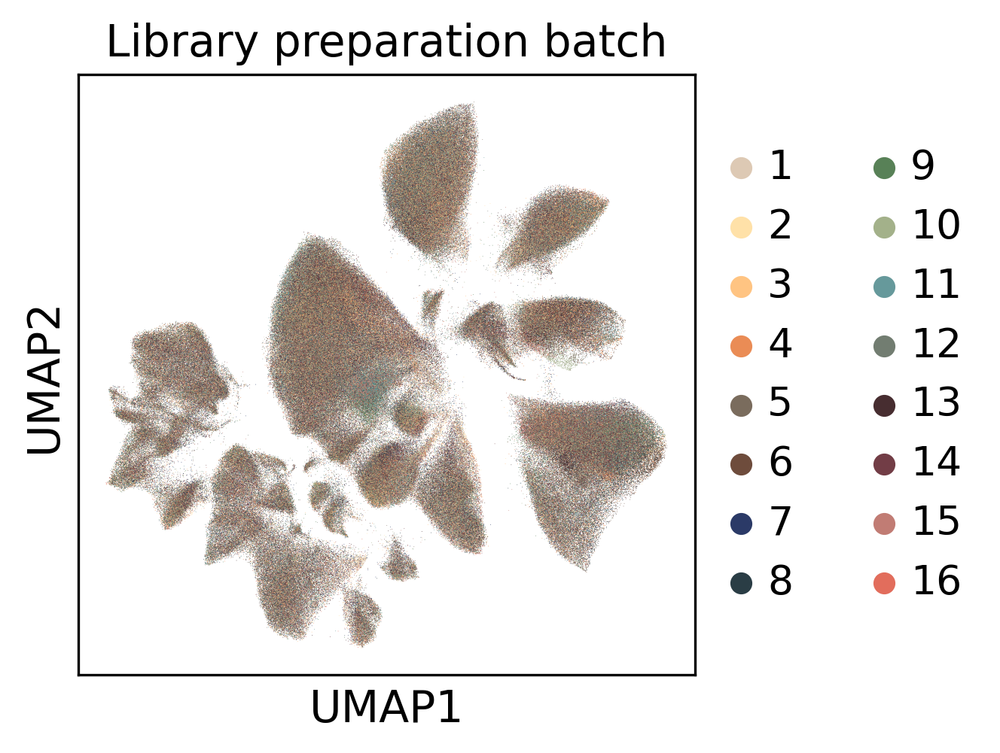

In [11]:
batch_colors =["#DDC9B4", "#FFE1A8", "#FFC482", '#EA8C55', "#7A6C5D", "#6e4c3c", "#2B3A67", "#2A3D45", "#588157", "#A3B18A", "#66999B", "#727D71", "#472D30", "#723D46", "#C17C74", "#E26D5C"]
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color=['6-Batch'], title='Library preparation batch', palette=batch_colors)
    #, save='_Batch_w_specific_col_final.pdf')

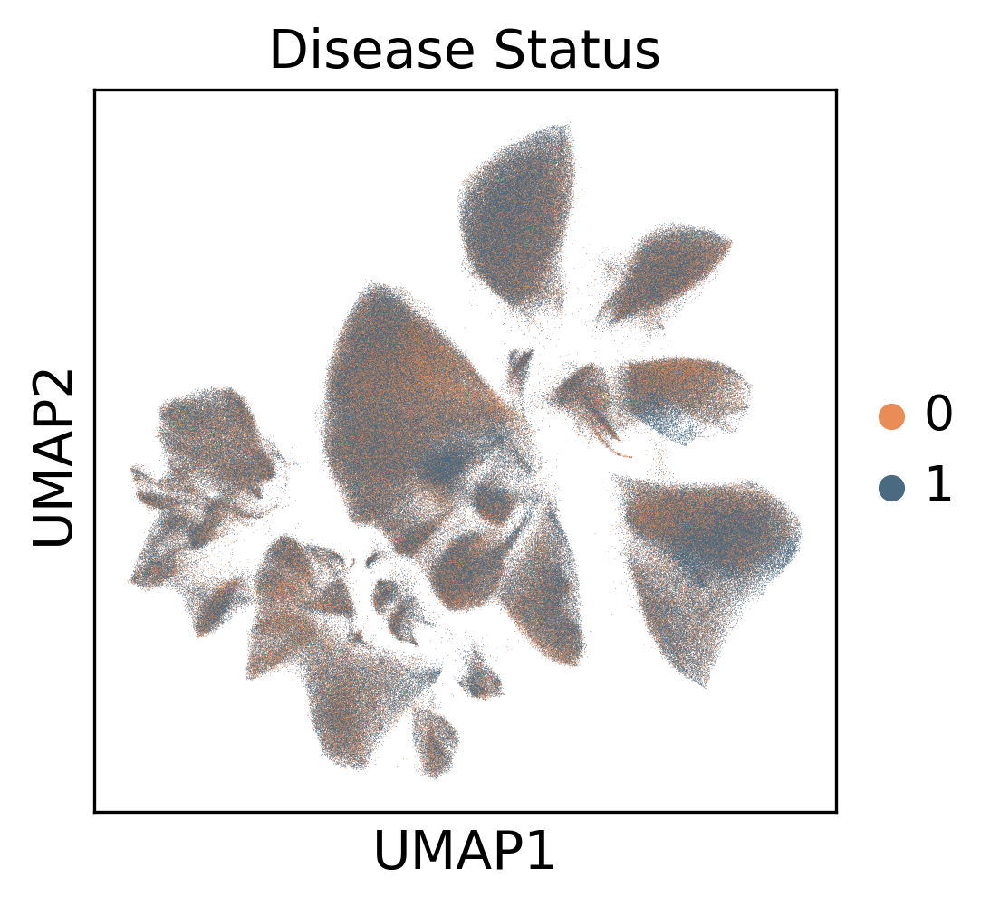

In [12]:
# make categorical
adata.obs['Status'] = adata.obs['Status'].apply(str)

Case_Control_colours = ["#EA8C55", "#496A81"]
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color=['Status'], palette=Case_Control_colours,  title='Disease Status')
    #, save='_Disease_Status_final.pdf')

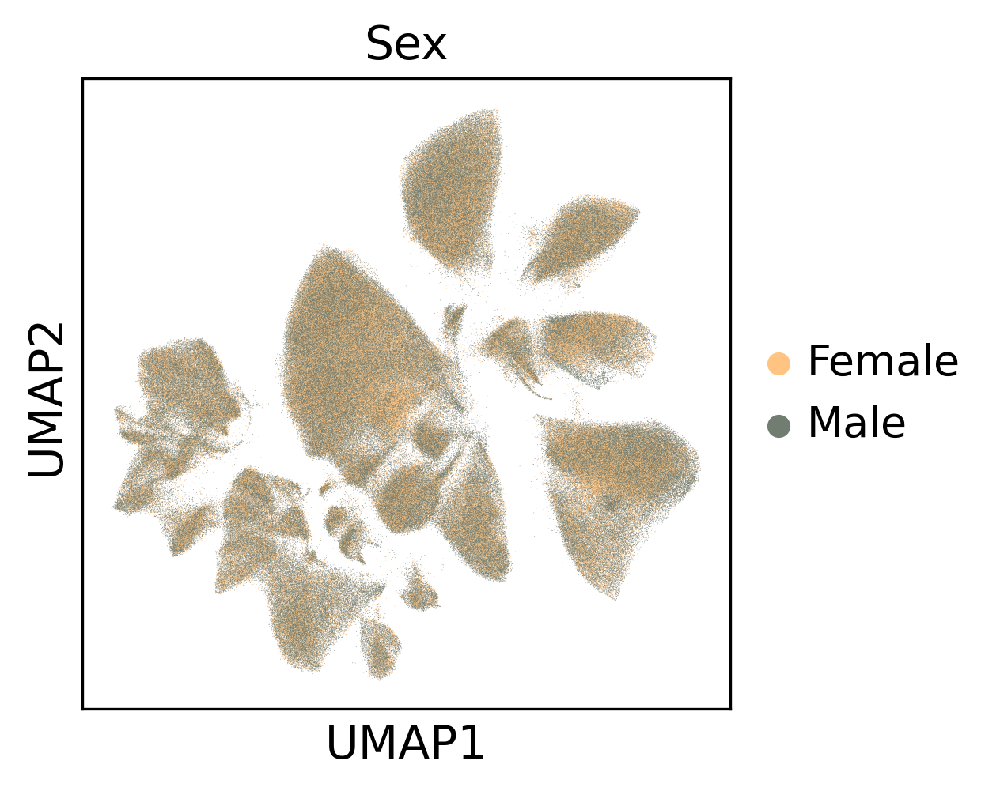

In [13]:
Sex_colours = ["#FFC482", "#727D71"]
with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color=['Sex'],title='Sex', palette=Sex_colours)
    #, save='_Sex_w_specific_col_final.pdf')

### Extended Data Fig 2c

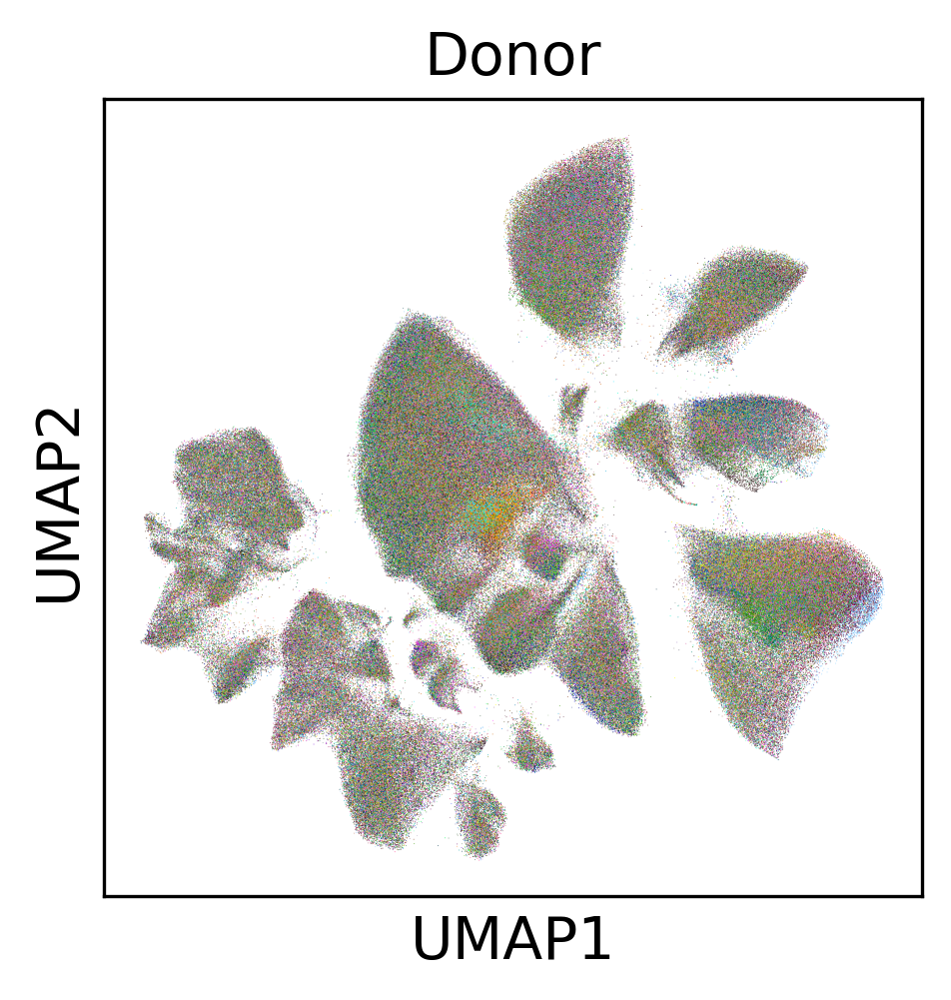

In [14]:
# make categorical
adata.obs['SU.Number'] = adata.obs['SU.Number'].apply(str)

with plt.rc_context({"figure.figsize": (3.5, 3.5)}):
    sc.pl.umap(adata, color=['SU.Number'], title='Donor', legend_loc=None)
    #, save='_Donor_final_no_legend.pdf')

### Extended Data Fig 3a-c

In [ ]:
### excitatory neurons

In [15]:
adata_exc = (adata[adata.obs['celltypes_final'].isin(["Exc_L2-3", "Exc_L3-5", "Exc_L4-6_1", "Exc_L4-6_2", "Exc_L4-6_3", "Exc_L5-6_1", "Exc_L5-6_2", "Exc_L5-6_HTR2C"])])

In [16]:
Exc_dict = {
    'excitatory': ['SLC17A7', 'GLS'],
    "2/3": ["CUX2", 'RFX3', 'LINC00507'], 
    "2-4": ['UNC5D'],
    "4": ['IL1RAPL2','CRIM1', 'RORB'],
    "4-6":['CLSTN2'],
    "5/6": ['RXFP1', "TOX", 'DLC1', 'TLE4', "ETV1"],
    "cluster-specific": ["HTR2C"]
}

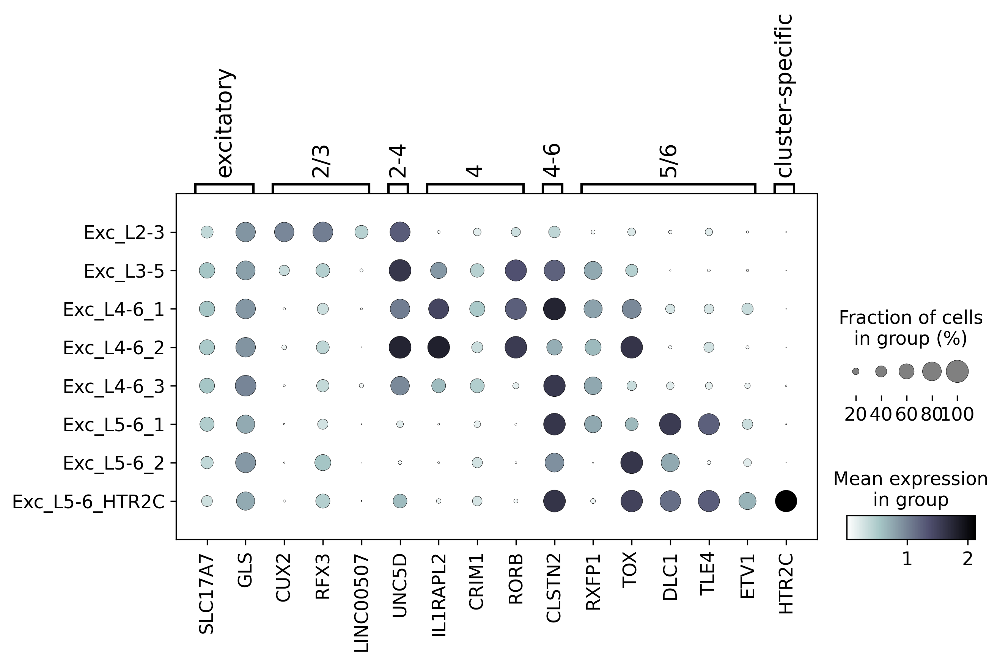

In [17]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_exc, Exc_dict, 'celltypes_final', dendrogram=False, cmap='bone_r', figsize=(9,4))
    #, save='dotblot_Exc_markers_bone_r.pdf')

In [ ]:
### inhibitory neurons

In [18]:
adata_inhib = (adata[adata.obs['celltypes_final'].isin(['In_LAMP5_1', 'In_LAMP5_2', 'In_RELN', 'In_SST', 'In_VIP', 'In_PVALB_Ba', 'In_PVALB_Ch'])])

In [19]:
In_marker_genes = ['GAD1', 'GAD2', 'LAMP5', 'NRG1','FREM1', 'CHST9', 'LHX6', 'PVALB', 'RORA','UNC5B', 'RELN','SST', 'VIP', 'CALB2']

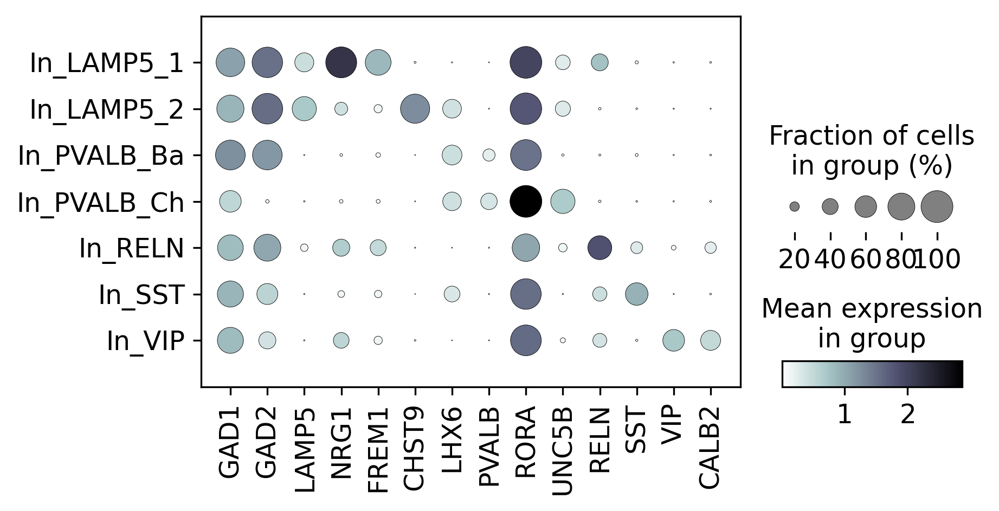

In [20]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_inhib, In_marker_genes, 'celltypes_final', dendrogram=False, cmap='bone_r', figsize=(6,3))
    #, save='dotblot_Inhib_markers_bone_r.pdf')

In [ ]:
### astrocytes

In [21]:
adata_Astro = (adata[adata.obs['celltypes_final'].isin(["Astro_FB", 'Astro_PP'])])

In [22]:
Astro_marker_genes = ['GFAP','ARHGEF4', 'DCLK2', 'ATP1A2','SGCD','GJA1', 'HPSE2', 'CABLES1','TPD52L1']

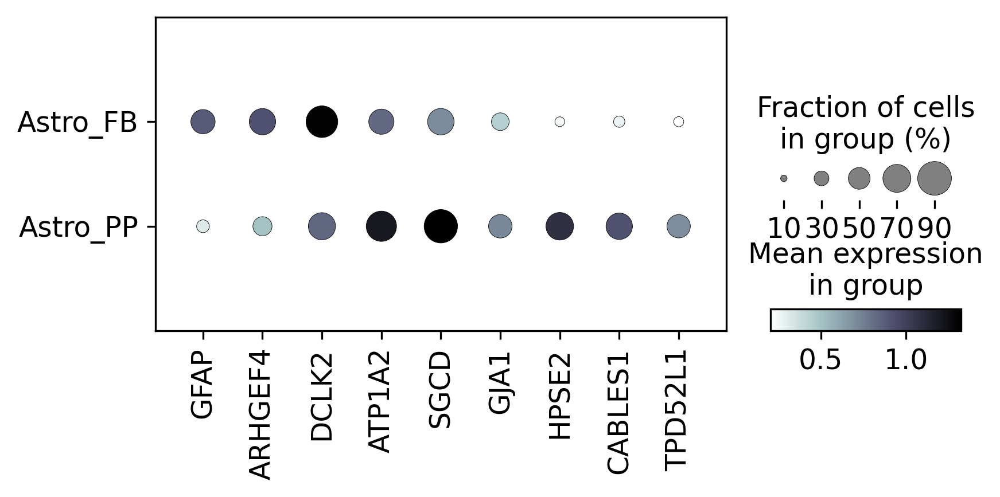

In [23]:
with plt.rc_context({"figure.figsize": (2, 2)}):
    sc.pl.dotplot(adata_Astro, Astro_marker_genes, 'celltypes_final', dendrogram=False, cmap='bone_r', figsize=(6,2.4))
    #, save='dotblot_Astro_markers_bone_r.pdf')

# extract anndata object for GEO upload

In [3]:
adata = sc.read("../datasets/adata_celltypes_after_manual_curation_20231120.h5ad")

In [4]:
adata.obs['Donor'] = adata.obs['individual'].copy()

In [5]:
ID_anonym =['s1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15',
            's16', 's17', 's18', 's19', 's20', 's21', 's22', 's23', 's24', 's25', 's26', 's27', 's28', 's29',
            's30', 's31', 's32', 's33', 's34', 's35', 's36', 's37', 's38', 's39', 's40', 's41', 's42', 's43',
            's44', 's45', 's46','s47', 's48', 's49', 's50', 's51', 's52', 's53', 's54', 's55', 's56', 's57', 's58',
            's59', 's60', 's61', 's62', 's63', 's64', 's65', 's66', 's67', 's68', 's69', 's70', 's71', 's72',
            's73', 's74', 's75', 's76', 's77', 's78', 's79', 's80', 's81', 's82', 's83', 's84', 's85', 's86', 's87']

In [6]:
adata.obs['Donor'] = adata.obs['individual'].cat.rename_categories(ID_anonym)
adata.obs['Donor']

index
AAACCCACAATCTCTT-1-0-0      s53
AAACCCAGTAGCTAAA-1-0-0      s53
AAACCCAGTATCGCGC-1-0-0      s53
AAACCCATCGTAGGAG-1-0-0      s53
AAACCCATCTGAACGT-1-0-0      s53
                           ... 
TTTGTTGGTCCGAAGA-1-91-90    s81
TTTGTTGGTGTCTTCC-1-91-90    s81
TTTGTTGGTTAGGCTT-1-91-90    s81
TTTGTTGTCAGCTTCC-1-91-90    s81
TTTGTTGTCGACCCAG-1-91-90    s81
Name: Donor, Length: 787685, dtype: category
Categories (87, object): ['s1', 's2', 's3', 's4', ..., 's84', 's85', 's86', 's87']

In [7]:
individual_donor_mappings = adata.obs[["individual", "Donor"]]

In [11]:
individual_donor_mappings.to_excel("../datasets/individual_anonymous_donor_label_mappings.xlsx", header=True, index=True)

In [23]:
#rename columns:
adata.obs['lib_batch'] = adata.obs['6-Batch'].copy()
adata.obs['freezer_storage_time_in_days'] = adata.obs['Freezer.storage.time..days.'].copy()
adata.obs['Smoking_Status'] = adata.obs['Smoking.status'].copy()
adata.obs['Disease_Status'] = adata.obs['Status'].copy()

In [24]:
# select columns of interest
adata.obs = adata.obs[["Donor", "Age", "AgeBin", "Sex", 'Disease_Status','Classification', 'PMI','Hemisphere',
                       'Brain.pH','RIN', 'Smoking_Status','freezer_storage_time_in_days', 'lib_batch', 
                       'n_genes_by_counts','log1p_n_genes_by_counts','total_counts',
                       'log1p_total_counts','pct_counts_in_top_50_genes','pct_counts_in_top_100_genes',
                       'pct_counts_in_top_200_genes','pct_counts_in_top_500_genes',
                       'total_counts_mito','log1p_total_counts_mito','pct_counts_mito','n_counts',
                       'n_genes','dd_doublet','dd_score','leiden_r1','leiden_r0.8', 'leiden_r0.5',
                       'celltype_r1','celltype_r0.8', 'celltypes_final','major_celltypes']]

In [25]:
adata.write("../datasets/adata_for_GEO.h5ad")

# SessionInfo

In [2]:
print(sys.version)

3.8.12 (default, Oct 12 2021, 13:49:34) 
[GCC 7.5.0]
